In [105]:
# Standard Imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import os

# Modeling Imports
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential, regularizers, Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import (Dense, Flatten, Input, Dropout, 
                                     Add, BatchNormalization, Activation, 
                                     Conv2D, MaxPooling2D, AveragePooling2D, 
                                     GlobalAveragePooling2D)
from tensorflow.keras.applications.resnet50 import ResNet50

from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay, 
                             accuracy_score, precision_score)
from sklearn.utils import class_weight

# Lime Imports
%load_ext autoreload
%autoreload 2
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries

import sys
sys.path.append(os.path.join(os.pardir, os.pardir, 'src'))
import functions as fx

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
train_path = os.path.join(os.pardir, os.pardir, 'data', 'train')
test_path = os.path.join(os.pardir, os.pardir, 'data', 'test')

In [3]:
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 30, zoom_range = 0.3,
                                   width_shift_range = 0.2, height_shift_range = 0.2,
                                   horizontal_flip = True, brightness_range = [0.5, 1.5], 
                                   validation_split = 0.1)
val_datagen = ImageDataGenerator(rescale = 1./255, validation_split = 0.1)
train_generator = train_datagen.flow_from_directory(
    train_path, seed = 55, target_size = (256, 256), 
    batch_size = 64, class_mode = 'binary', 
    classes = ['perennials', 'weeds'], subset = 'training')
val_generator = val_datagen.flow_from_directory(
    train_path, seed = 55, target_size = (256, 256),
    batch_size = 64, class_mode = 'binary', 
    classes = ['perennials', 'weeds'], subset = 'validation')
test_generator = ImageDataGenerator(rescale = 1./255.) \
    .flow_from_directory(test_path, target_size = (256, 256), 
                         batch_size = 64, class_mode = 'binary', 
                         classes = ['perennials', 'weeds'])

Found 4698 images belonging to 2 classes.
Found 521 images belonging to 2 classes.
Found 580 images belonging to 2 classes.


In [4]:
# Calculate weights to balance perennial and weed data in training set
class_weights = class_weight.compute_class_weight(
    class_weight = 'balanced', classes = np.unique(train_generator.classes), 
    y = train_generator.classes)
train_class_weights = dict(enumerate(class_weights))

# Stop training if validation accuracy does not decrease in 15 epochs
early_stop_loss = EarlyStopping(monitor = 'val_accuracy', patience = 15, restore_best_weights = True)

In [20]:
def trial_1(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu'),
        Dense(82, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [21]:
model_1 = trial_1(train_generator[0][0][0])
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization (BatchNo (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_1 (Flatten)          (None, 59536)            

In [22]:
result_1 = model_1.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 102s 1s/step - loss: 2.0439 - accuracy: 0.6379 - precision: 0.6486 - val_loss: 0.7156 - val_accuracy: 0.5355 - val_precision: 0.5262
Epoch 2/50
74/74 [==============================] - 102s 1s/step - loss: 1.1153 - accuracy: 0.6433 - precision: 0.6515 - val_loss: 1.1671 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 101s 1s/step - loss: 0.8638 - accuracy: 0.6637 - precision: 0.6699 - val_loss: 0.8397 - val_accuracy: 0.5240 - val_precision: 0.5194
Epoch 4/50
74/74 [==============================] - 100s 1s/step - loss: 0.7950 - accuracy: 0.6911 - precision: 0.6973 - val_loss: 1.2737 - val_accuracy: 0.5163 - val_precision: 0.5154
Epoch 5/50
74/74 [==============================] - 101s 1s/step - loss: 0.6818 - accuracy: 0.6939 - precision: 0.6953 - val_loss: 2.0496 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 6/50
74/74 [==============================] - 100s 1s/step - loss: 0.

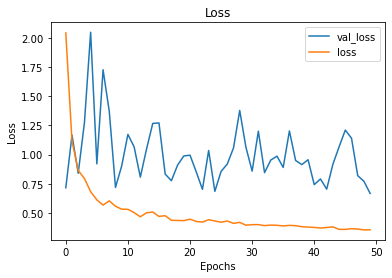

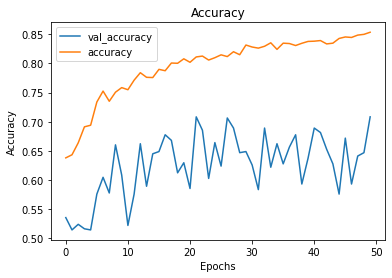

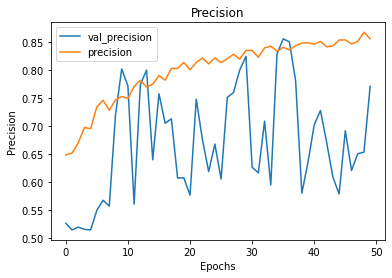

In [23]:
fx.visualize_training_results(result_1)

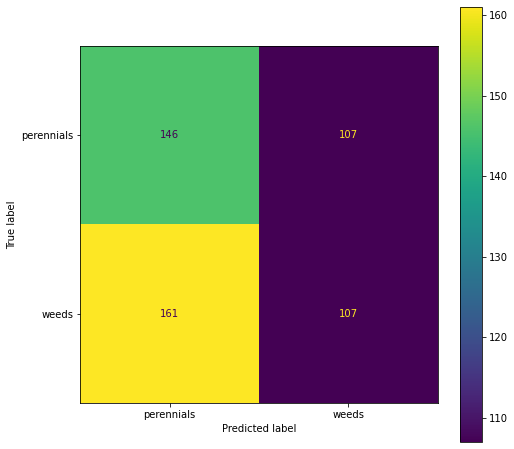

In [24]:
fx.create_confusion_matrix(model_1, val_generator)

In [25]:
fx.get_metrics(model_1, val_generator)

Accuracy: 0.508637236084453
Precision: 0.5280373831775701


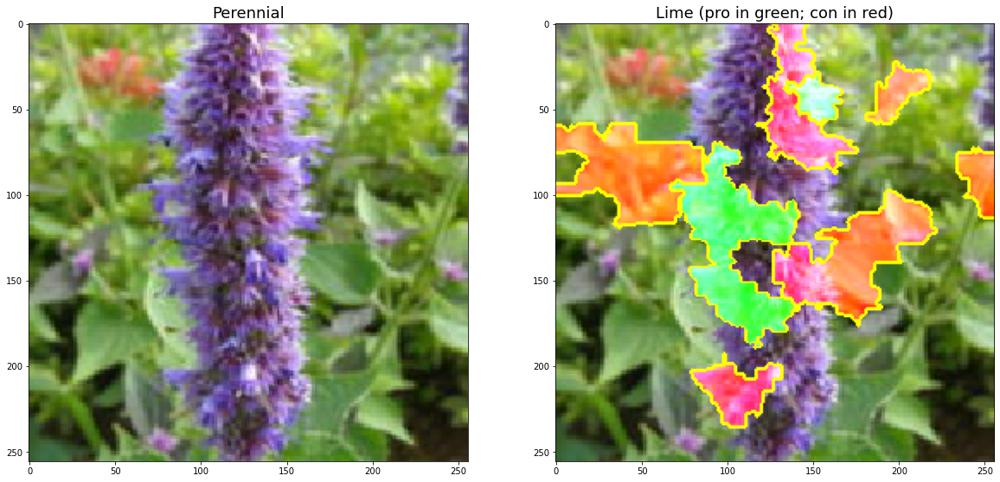

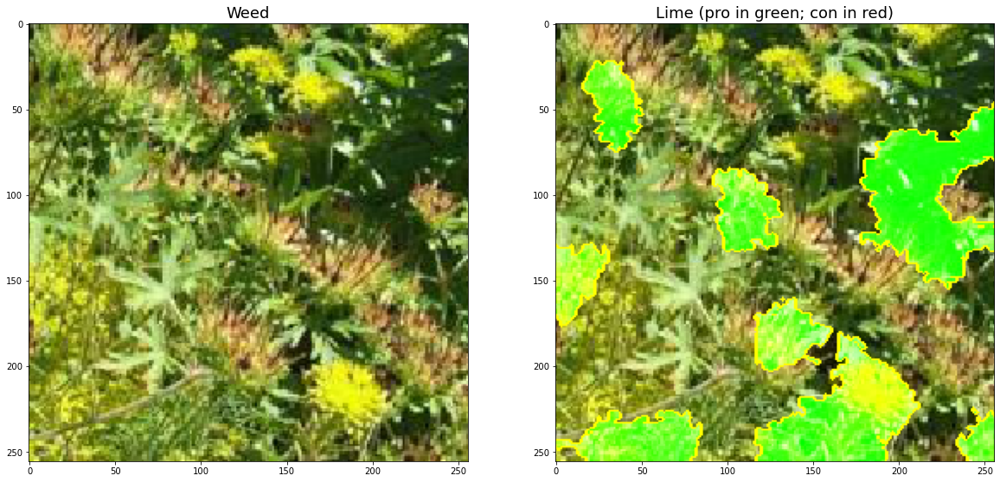

In [26]:
fx.display_lime(model_1, val_generator)

In [27]:
def trial_2(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(32, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu'),
        Dense(82, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [28]:
model_2 = trial_2(train_generator[0][0][0])
model_2.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 61, 61, 16)        64        
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 57, 57, 32)       

In [29]:
result_2 = model_2.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 101s 1s/step - loss: 1.1783 - accuracy: 0.6337 - precision: 0.6426 - val_loss: 0.8681 - val_accuracy: 0.5144 - val_precision: 0.5155
Epoch 2/50
74/74 [==============================] - 101s 1s/step - loss: 0.7897 - accuracy: 0.6926 - precision: 0.6987 - val_loss: 1.1834 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 99s 1s/step - loss: 0.6667 - accuracy: 0.7201 - precision: 0.7250 - val_loss: 1.4419 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 4/50
74/74 [==============================] - 99s 1s/step - loss: 0.6052 - accuracy: 0.7522 - precision: 0.7495 - val_loss: 1.3372 - val_accuracy: 0.5163 - val_precision: 0.5154
Epoch 5/50
74/74 [==============================] - 99s 1s/step - loss: 0.6143 - accuracy: 0.7341 - precision: 0.7338 - val_loss: 1.6656 - val_accuracy: 0.5259 - val_precision: 0.5204
Epoch 6/50
74/74 [==============================] - 99s 1s/step - loss: 0.5360

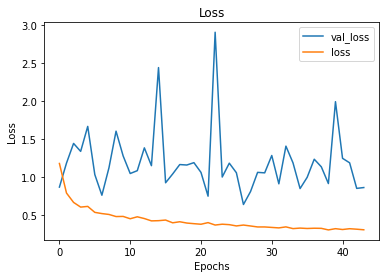

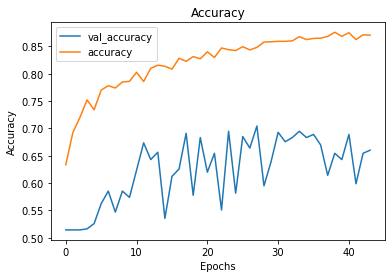

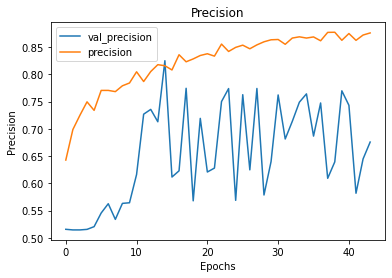

In [30]:
fx.visualize_training_results(result_2)

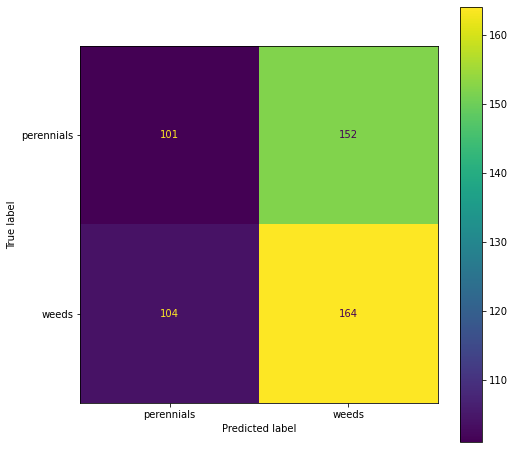

In [31]:
fx.create_confusion_matrix(model_2, val_generator)

In [32]:
fx.get_metrics(model_2, val_generator)

Accuracy: 0.4894433781190019
Precision: 0.5031645569620253


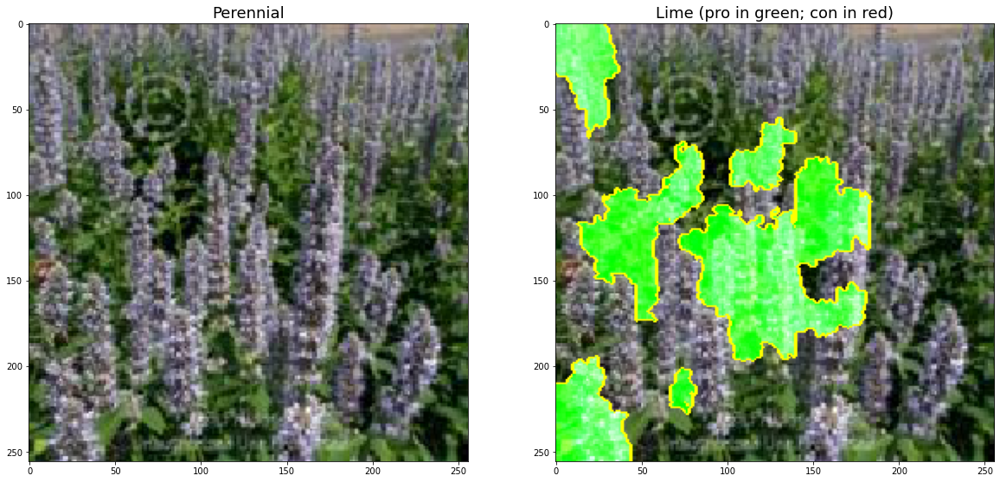

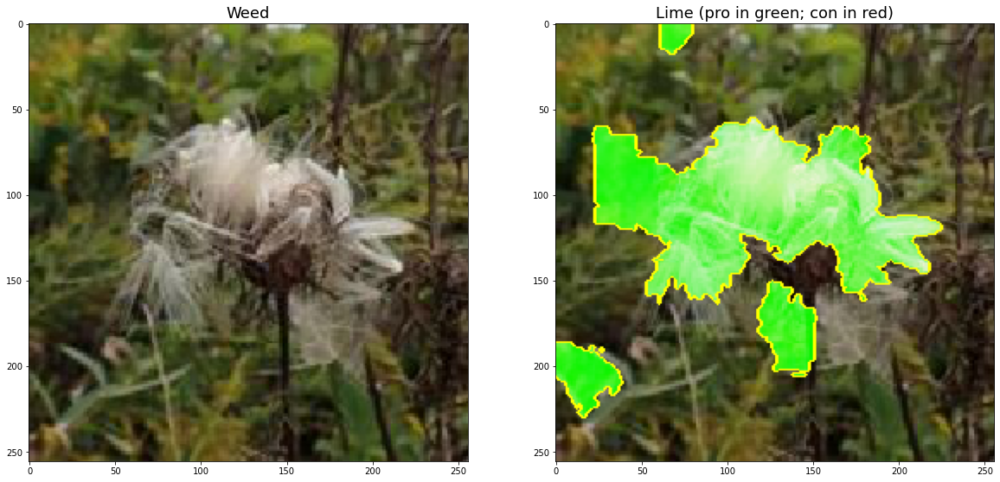

In [33]:
fx.display_lime(model_2, val_generator)

In [39]:
def trial_3(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu', kernel_regularizer = regularizers.l2(0.05)),
        Dense(82, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [40]:
model_3 = trial_3(train_generator[0][0][0])
model_3.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_5 (Flatten)          (None, 59536)            

In [41]:
result_3 = model_3.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 101s 1s/step - loss: 8.2086 - accuracy: 0.6618 - precision: 0.6702 - val_loss: 3.7526 - val_accuracy: 0.5355 - val_precision: 0.5271
Epoch 2/50
74/74 [==============================] - 98s 1s/step - loss: 3.4915 - accuracy: 0.6833 - precision: 0.6896 - val_loss: 3.2130 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 97s 1s/step - loss: 2.8755 - accuracy: 0.7186 - precision: 0.7157 - val_loss: 3.0572 - val_accuracy: 0.4875 - val_precision: 1.0000
Epoch 4/50
74/74 [==============================] - 97s 1s/step - loss: 3.1483 - accuracy: 0.7214 - precision: 0.7155 - val_loss: 3.6164 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 5/50
74/74 [==============================] - 100s 1s/step - loss: 2.4771 - accuracy: 0.7341 - precision: 0.7284 - val_loss: 3.0545 - val_accuracy: 0.5163 - val_precision: 0.5154
Epoch 6/50
74/74 [==============================] - 98s 1s/step - loss: 2.4193

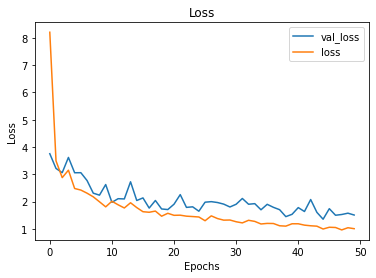

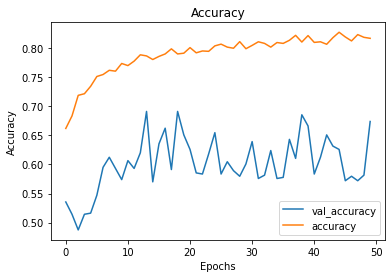

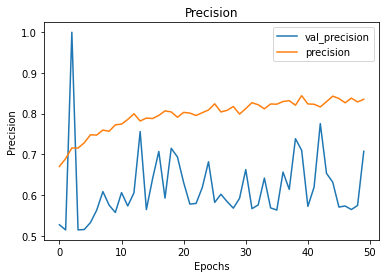

In [42]:
fx.visualize_training_results(result_3)

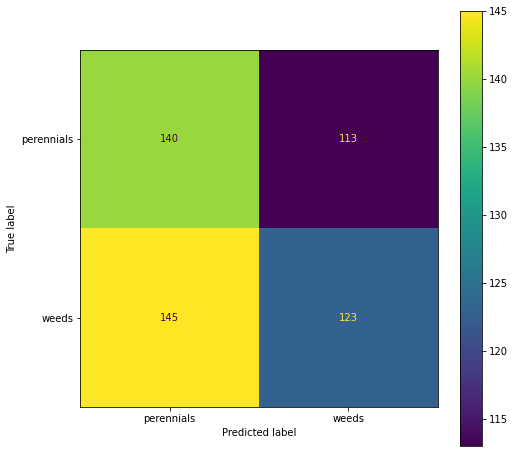

In [43]:
fx.create_confusion_matrix(model_3, val_generator)

In [44]:
fx.get_metrics(model_3, val_generator)

Accuracy: 0.4817658349328215
Precision: 0.4957627118644068


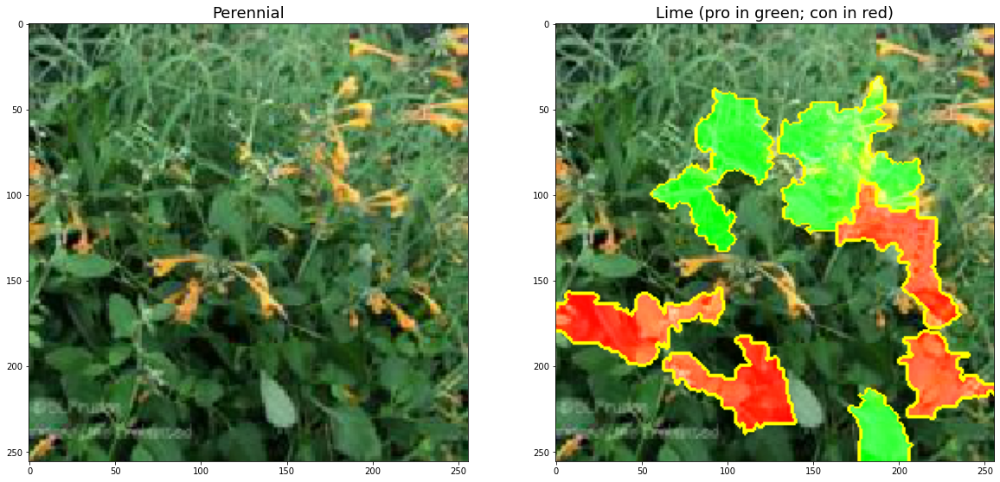

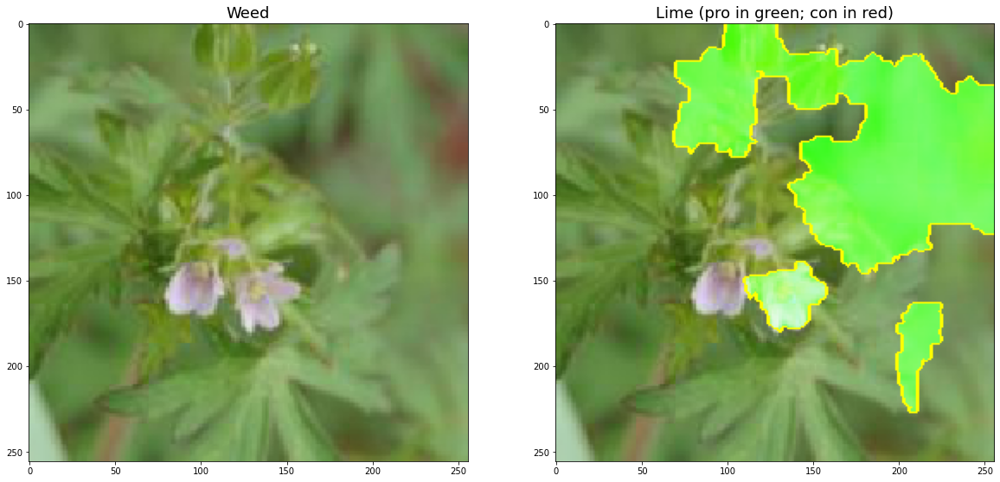

In [45]:
fx.display_lime(model_3, val_generator)

In [46]:
def trial_4(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        Dense(82, activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [47]:
model_4 = trial_4(train_generator[0][0][0])
model_4.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_11 (Batc (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_12 (Batc (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_6 (Flatten)          (None, 59536)            

In [48]:
result_4 = model_4.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 101s 1s/step - loss: 5.2641 - accuracy: 0.6409 - precision: 0.6460 - val_loss: 4.2080 - val_accuracy: 0.4856 - val_precision: 0.0000e+00
Epoch 2/50
74/74 [==============================] - 102s 1s/step - loss: 3.5191 - accuracy: 0.6824 - precision: 0.6853 - val_loss: 3.1593 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 101s 1s/step - loss: 2.7040 - accuracy: 0.7131 - precision: 0.7024 - val_loss: 4.0748 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 4/50
74/74 [==============================] - 101s 1s/step - loss: 2.6106 - accuracy: 0.6924 - precision: 0.6889 - val_loss: 2.9213 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 5/50
74/74 [==============================] - 100s 1s/step - loss: 2.2944 - accuracy: 0.7148 - precision: 0.7012 - val_loss: 2.1711 - val_accuracy: 0.5374 - val_precision: 0.5269
Epoch 6/50
74/74 [==============================] - 100s 1s/step - loss

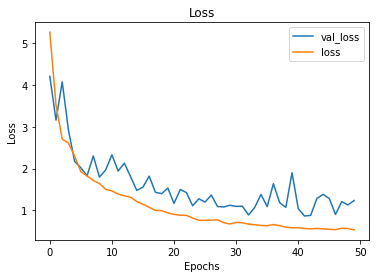

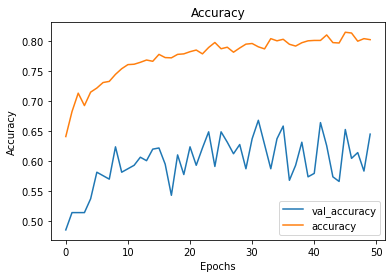

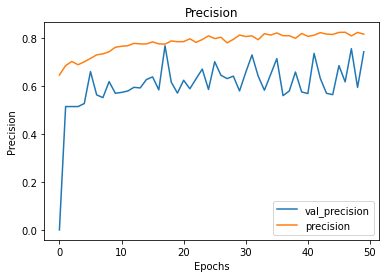

In [49]:
fx.visualize_training_results(result_4)

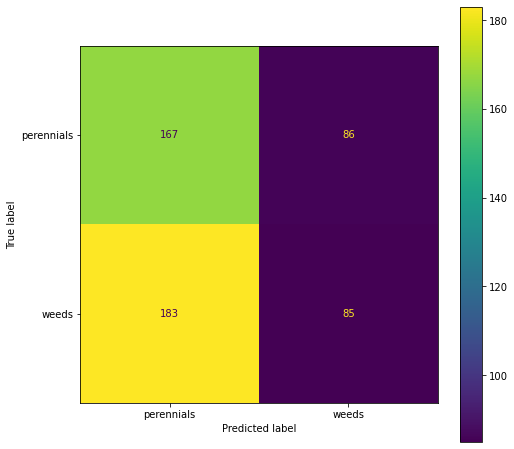

In [50]:
fx.create_confusion_matrix(model_4, val_generator)

In [51]:
fx.get_metrics(model_4, val_generator)

Accuracy: 0.4952015355086372
Precision: 0.5146198830409356


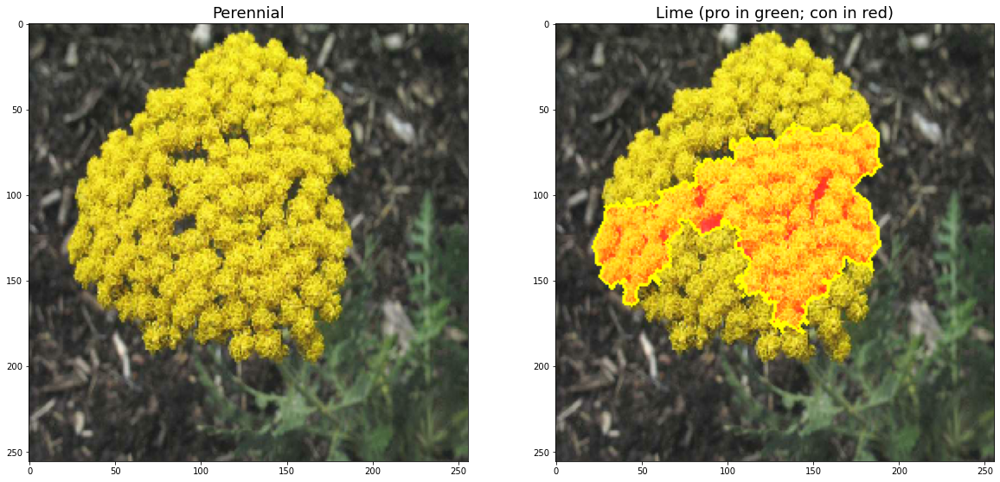

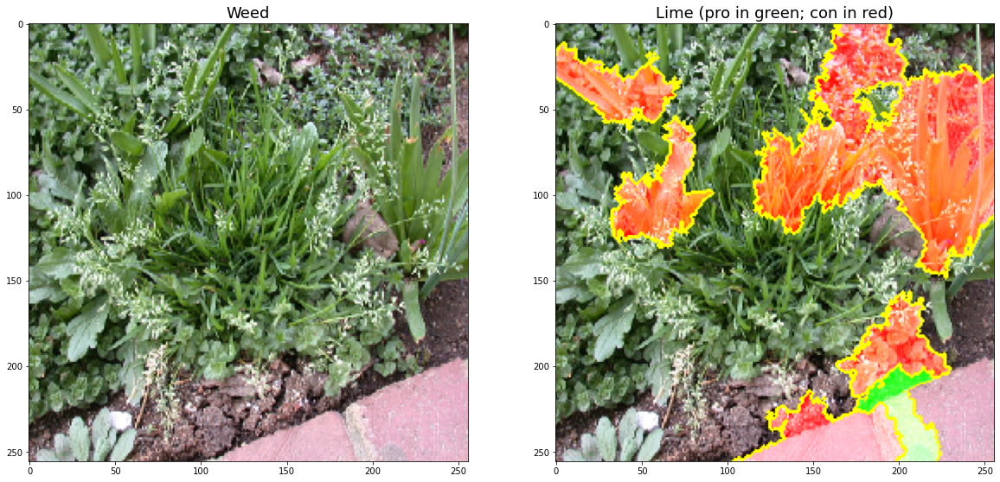

In [52]:
fx.display_lime(model_4, val_generator)

In [53]:
def trial_5(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu', kernel_regularizer = regularizers.l2(0.005)),
        Dense(82, activation = 'relu', kernel_regularizer = regularizers.l2(0.005)),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [54]:
model_5 = trial_5(train_generator[0][0][0])
model_5.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_13 (Batc (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_14 (Batc (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_7 (Flatten)          (None, 59536)            

In [56]:
result_5 = model_5.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 101s 1s/step - loss: 4.4495 - accuracy: 0.6390 - precision: 0.6528 - val_loss: 3.2243 - val_accuracy: 0.5605 - val_precision: 0.5430
Epoch 2/50
74/74 [==============================] - 100s 1s/step - loss: 3.5075 - accuracy: 0.6556 - precision: 0.6685 - val_loss: 3.4781 - val_accuracy: 0.5163 - val_precision: 0.5155
Epoch 3/50
74/74 [==============================] - 99s 1s/step - loss: 2.9992 - accuracy: 0.6828 - precision: 0.6882 - val_loss: 2.8337 - val_accuracy: 0.5393 - val_precision: 0.5310
Epoch 4/50
74/74 [==============================] - 99s 1s/step - loss: 2.6002 - accuracy: 0.6875 - precision: 0.6939 - val_loss: 2.4596 - val_accuracy: 0.5893 - val_precision: 0.5925
Epoch 5/50
74/74 [==============================] - 99s 1s/step - loss: 2.2891 - accuracy: 0.7016 - precision: 0.7086 - val_loss: 2.2744 - val_accuracy: 0.5912 - val_precision: 0.5700
Epoch 6/50
74/74 [==============================] - 99s 1s/step - loss: 2.1582

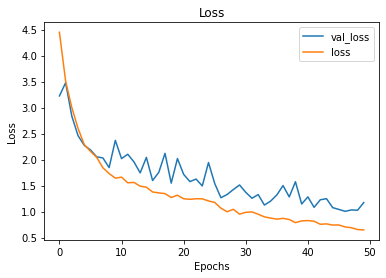

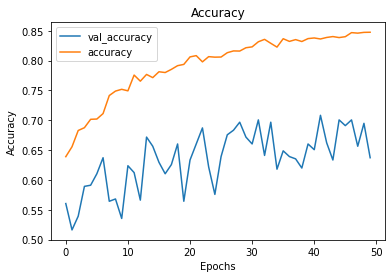

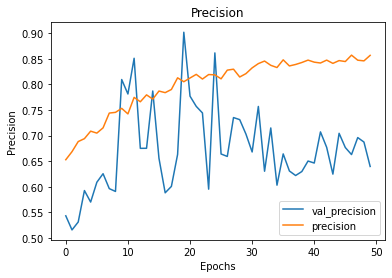

In [57]:
fx.visualize_training_results(result_5)

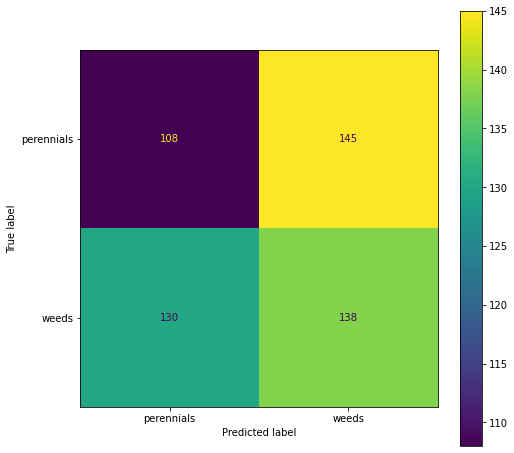

In [58]:
fx.create_confusion_matrix(model_5, val_generator)

In [59]:
fx.get_metrics(model_5, val_generator)

Accuracy: 0.46833013435700577
Precision: 0.4840989399293286


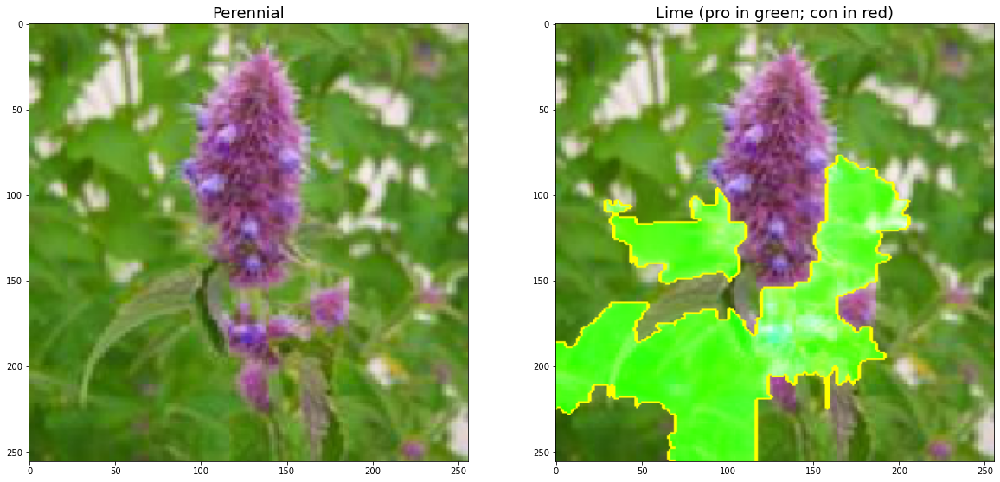

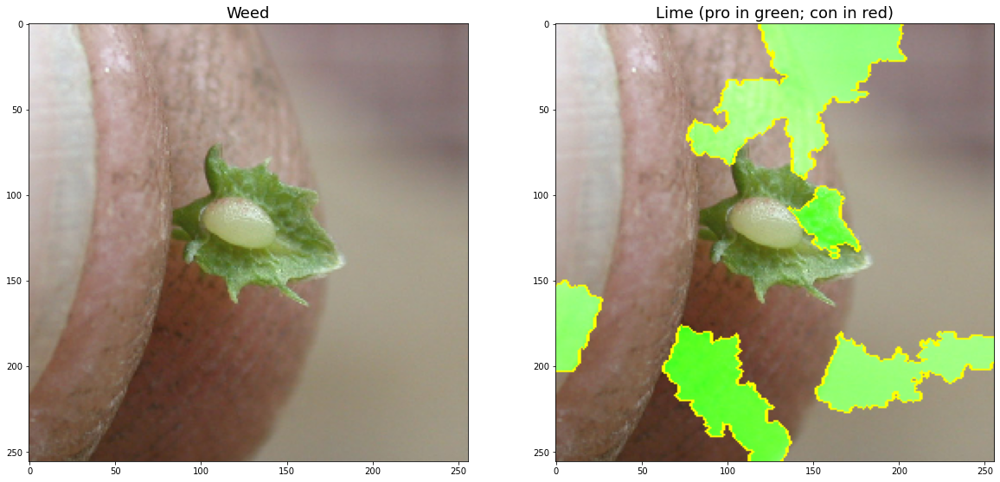

In [60]:
fx.display_lime(model_5, val_generator)

In [63]:
def trial_6(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu', kernel_regularizer = regularizers.l2(0.05)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu'),
        Dense(82, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [64]:
model_6 = trial_6(train_generator[0][0][0])
model_6.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_17 (Conv2D)           (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_15 (Batc (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_16 (Batc (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_8 (Flatten)          (None, 59536)            

In [65]:
result_6 = model_6.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 102s 1s/step - loss: 1.5208 - accuracy: 0.6330 - precision: 0.6438 - val_loss: 0.9413 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 2/50
74/74 [==============================] - 103s 1s/step - loss: 0.8872 - accuracy: 0.6720 - precision: 0.6716 - val_loss: 2.6727 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 102s 1s/step - loss: 0.7910 - accuracy: 0.7005 - precision: 0.6976 - val_loss: 2.5462 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 4/50
74/74 [==============================] - 101s 1s/step - loss: 0.7497 - accuracy: 0.7184 - precision: 0.7160 - val_loss: 3.5862 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 5/50
74/74 [==============================] - 99s 1s/step - loss: 0.6941 - accuracy: 0.7352 - precision: 0.7242 - val_loss: 2.8674 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 6/50
74/74 [==============================] - 99s 1s/step - loss: 0.71

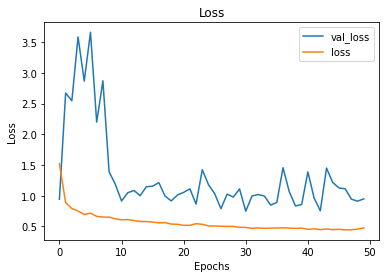

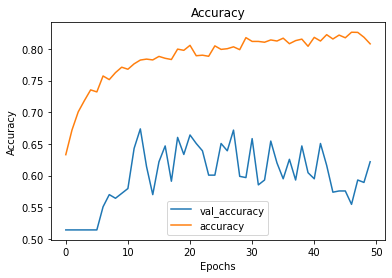

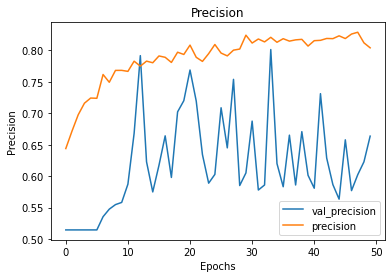

In [66]:
fx.visualize_training_results(result_6)

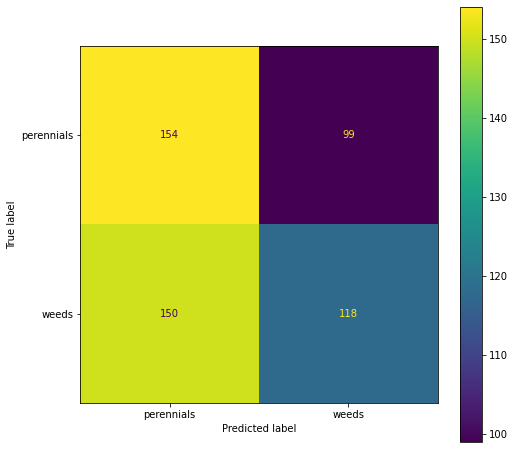

In [67]:
fx.create_confusion_matrix(model_6, val_generator)

In [68]:
fx.get_metrics(model_6, val_generator)

Accuracy: 0.46065259117082535
Precision: 0.4700460829493088


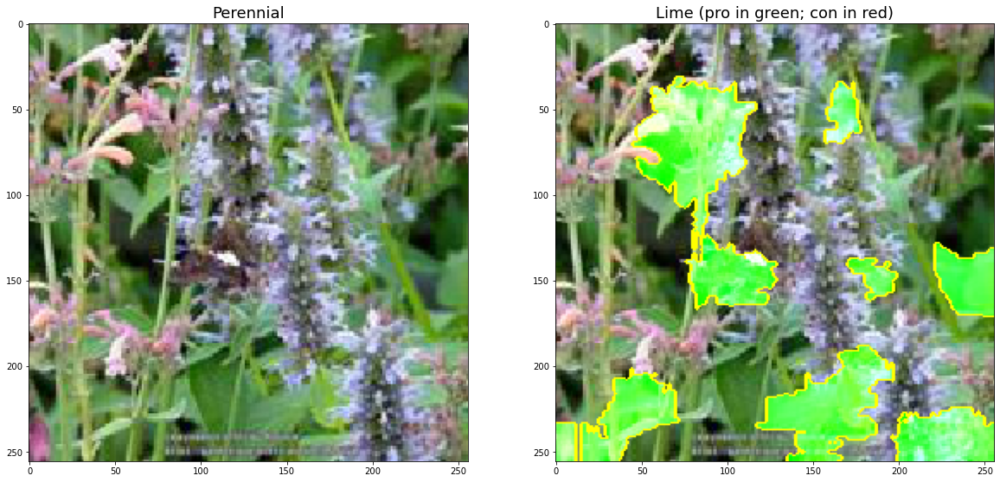

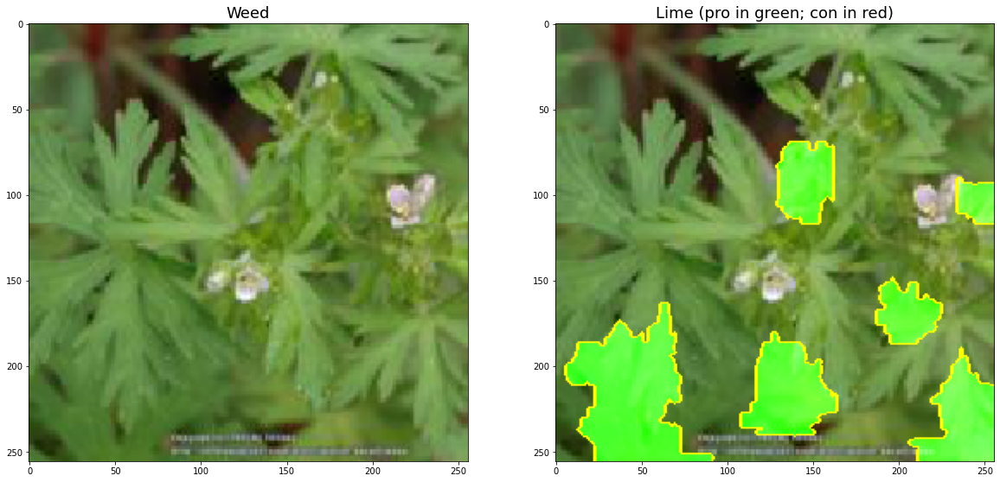

In [69]:
fx.display_lime(model_6, val_generator)

In [70]:
def trial_7(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu'),
        Dense(82, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [71]:
model_7 = trial_7(train_generator[0][0][0])
model_7.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_19 (Conv2D)           (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_17 (Batc (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_18 (Batc (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_9 (Flatten)          (None, 59536)            

In [72]:
result_7 = model_7.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 99s 1s/step - loss: 1.7523 - accuracy: 0.6364 - precision: 0.6436 - val_loss: 1.3076 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 2/50
74/74 [==============================] - 98s 1s/step - loss: 1.0068 - accuracy: 0.6771 - precision: 0.6859 - val_loss: 0.8297 - val_accuracy: 0.5374 - val_precision: 0.5313
Epoch 3/50
74/74 [==============================] - 97s 1s/step - loss: 0.8743 - accuracy: 0.6728 - precision: 0.6801 - val_loss: 0.8760 - val_accuracy: 0.5432 - val_precision: 0.5299
Epoch 4/50
74/74 [==============================] - 100s 1s/step - loss: 0.7962 - accuracy: 0.6969 - precision: 0.7046 - val_loss: 2.1342 - val_accuracy: 0.5202 - val_precision: 0.5174
Epoch 5/50
74/74 [==============================] - 99s 1s/step - loss: 0.8061 - accuracy: 0.6943 - precision: 0.7018 - val_loss: 0.8657 - val_accuracy: 0.5451 - val_precision: 0.5353
Epoch 6/50
74/74 [==============================] - 99s 1s/step - loss: 0.7121 

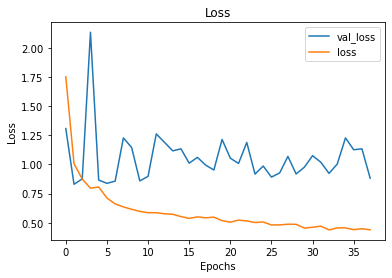

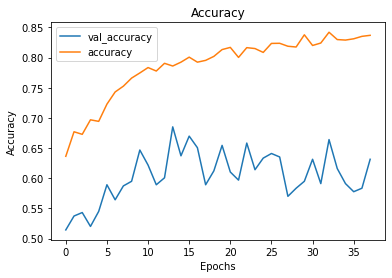

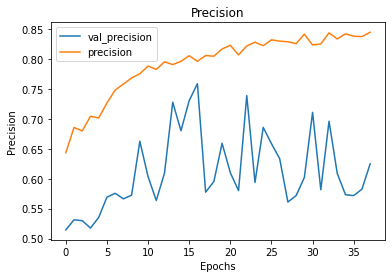

In [73]:
fx.visualize_training_results(result_7)

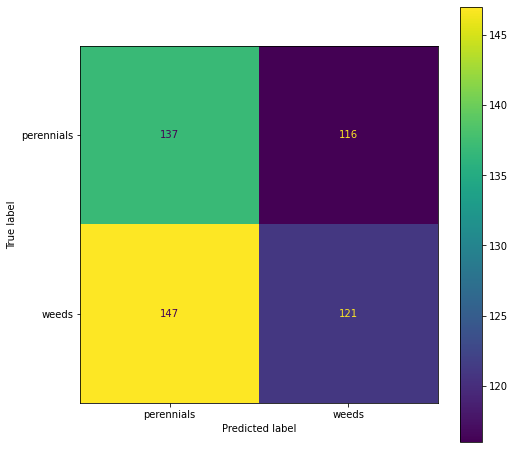

In [74]:
fx.create_confusion_matrix(model_7, val_generator)

In [75]:
fx.get_metrics(model_7, val_generator)

Accuracy: 0.5182341650671785
Precision: 0.5358649789029536


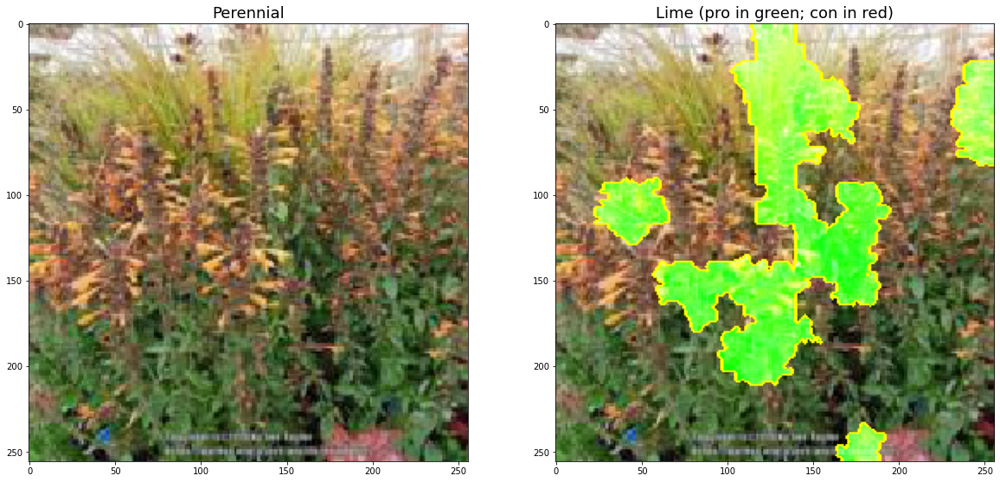

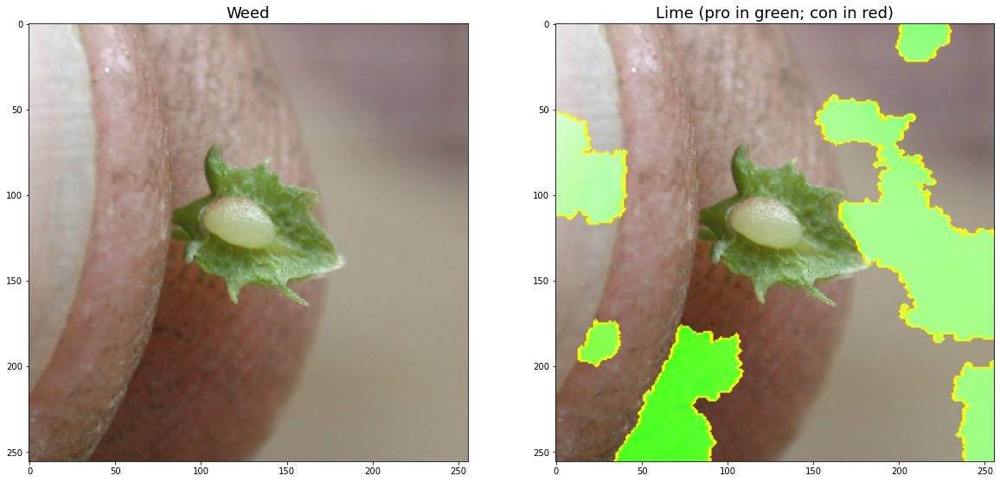

In [76]:
fx.display_lime(model_7, val_generator)

In [77]:
def trial_8(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        Dense(82, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [78]:
model_8 = trial_8(train_generator[0][0][0])
model_8.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_19 (Batc (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_20 (Batc (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_10 (Flatten)         (None, 59536)            

In [79]:
result_8 = model_8.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 104s 1s/step - loss: 5.2128 - accuracy: 0.6381 - precision: 0.6489 - val_loss: 4.0137 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 2/50
74/74 [==============================] - 100s 1s/step - loss: 3.7292 - accuracy: 0.6707 - precision: 0.6749 - val_loss: 4.0826 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 100s 1s/step - loss: 2.8950 - accuracy: 0.7120 - precision: 0.6979 - val_loss: 2.6388 - val_accuracy: 0.4875 - val_precision: 0.5263
Epoch 4/50
74/74 [==============================] - 100s 1s/step - loss: 2.2286 - accuracy: 0.7365 - precision: 0.7276 - val_loss: 3.0054 - val_accuracy: 0.5278 - val_precision: 0.5216
Epoch 5/50
74/74 [==============================] - 99s 1s/step - loss: 2.1908 - accuracy: 0.7488 - precision: 0.7393 - val_loss: 3.2356 - val_accuracy: 0.5182 - val_precision: 0.5164
Epoch 6/50
74/74 [==============================] - 99s 1s/step - loss: 2.04

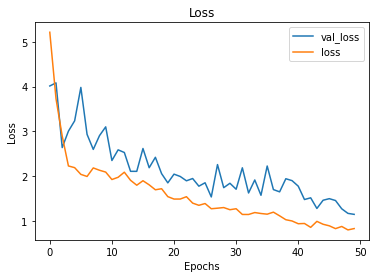

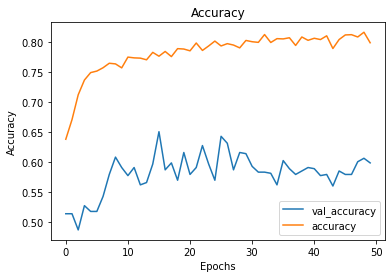

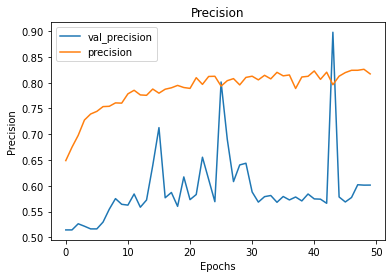

In [80]:
fx.visualize_training_results(result_8)

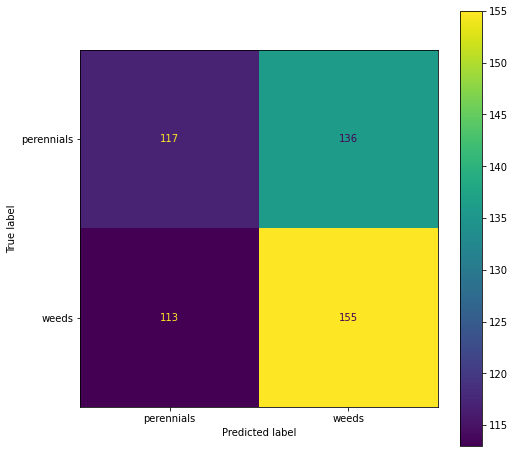

In [81]:
fx.create_confusion_matrix(model_8, val_generator)

In [82]:
fx.get_metrics(model_8, val_generator)

Accuracy: 0.5412667946257198
Precision: 0.5498281786941581


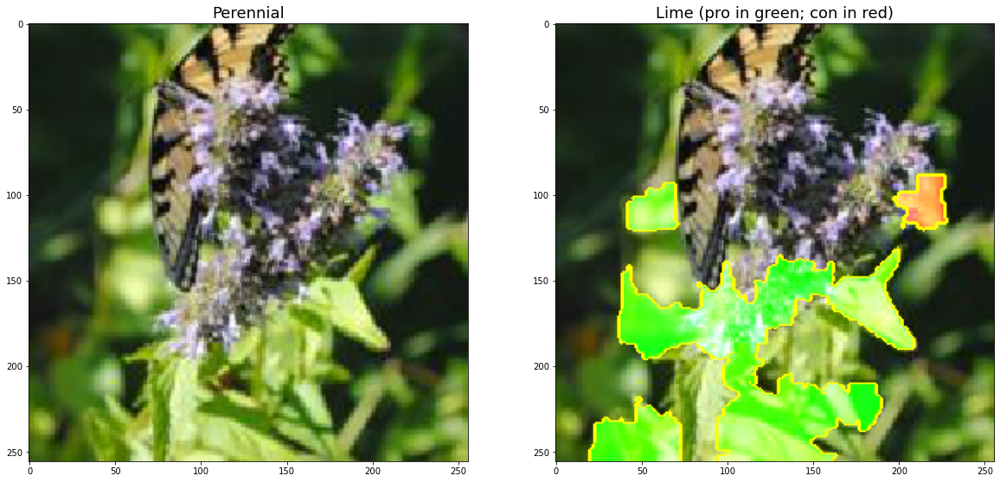

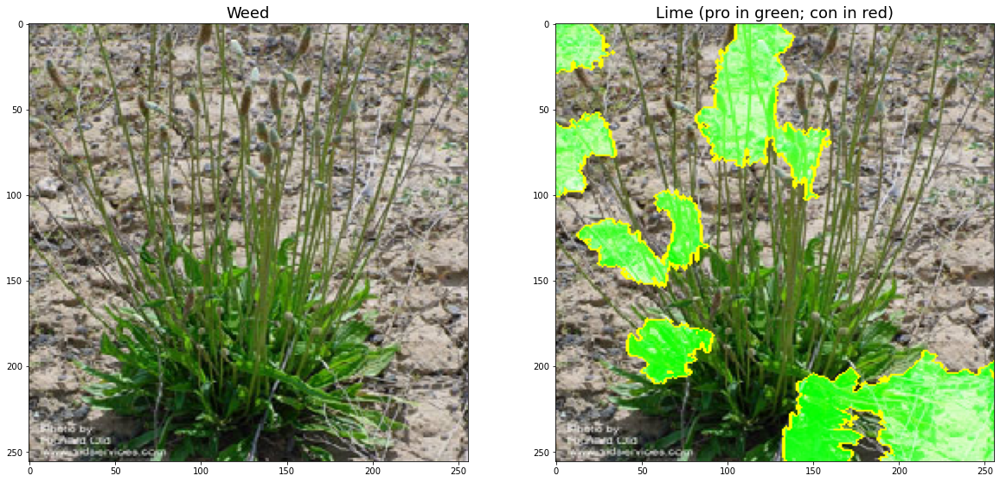

In [83]:
fx.display_lime(model_8, val_generator)

In [84]:
def trial_9(image):
    layers = [
        Input(image.shape),
        Conv2D(6, (5, 5), activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(16, (5, 5), activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(120, activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        Dense(82, activation = 'relu', kernel_regularizer = regularizers.l2(0.01)),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [85]:
model_9 = trial_9(train_generator[0][0][0])
model_9.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_23 (Conv2D)           (None, 252, 252, 6)       456       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 126, 126, 6)       0         
_________________________________________________________________
batch_normalization_21 (Batc (None, 126, 126, 6)       24        
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 122, 122, 16)      2416      
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 61, 61, 16)        0         
_________________________________________________________________
batch_normalization_22 (Batc (None, 61, 61, 16)        64        
_________________________________________________________________
flatten_11 (Flatten)         (None, 59536)            

In [86]:
result_9 = model_9.fit(train_generator, epochs = 50, validation_data=val_generator,
                       class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 117s 2s/step - loss: 5.7897 - accuracy: 0.6507 - precision: 0.6633 - val_loss: 5.3058 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 2/50
74/74 [==============================] - 105s 1s/step - loss: 4.1956 - accuracy: 0.6960 - precision: 0.6987 - val_loss: 5.7301 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 105s 1s/step - loss: 3.6046 - accuracy: 0.7054 - precision: 0.7114 - val_loss: 4.2130 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 4/50
74/74 [==============================] - 104s 1s/step - loss: 3.2260 - accuracy: 0.7235 - precision: 0.7248 - val_loss: 5.2776 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 5/50
74/74 [==============================] - 106s 1s/step - loss: 2.8779 - accuracy: 0.7346 - precision: 0.7363 - val_loss: 3.9389 - val_accuracy: 0.5163 - val_precision: 0.5154
Epoch 6/50
74/74 [==============================] - 106s 1s/step - loss: 2.

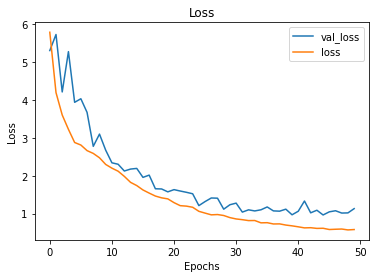

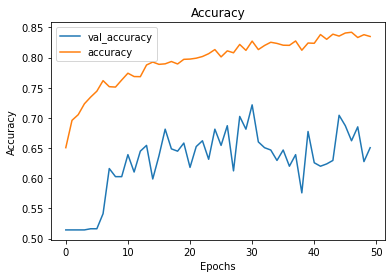

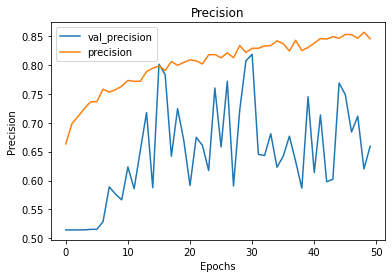

In [87]:
fx.visualize_training_results(result_9)

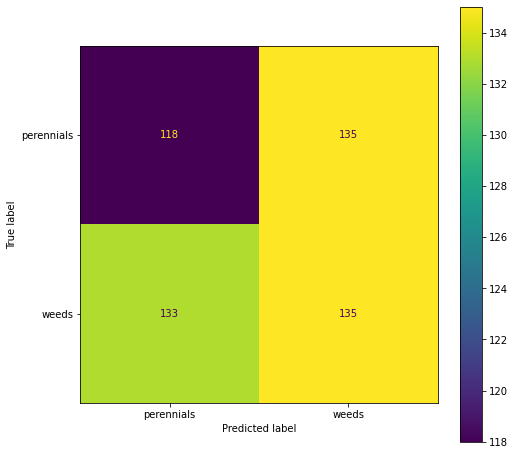

In [88]:
fx.create_confusion_matrix(model_9, val_generator)

In [89]:
fx.get_metrics(model_9, val_generator)

Accuracy: 0.5239923224568138
Precision: 0.5370370370370371


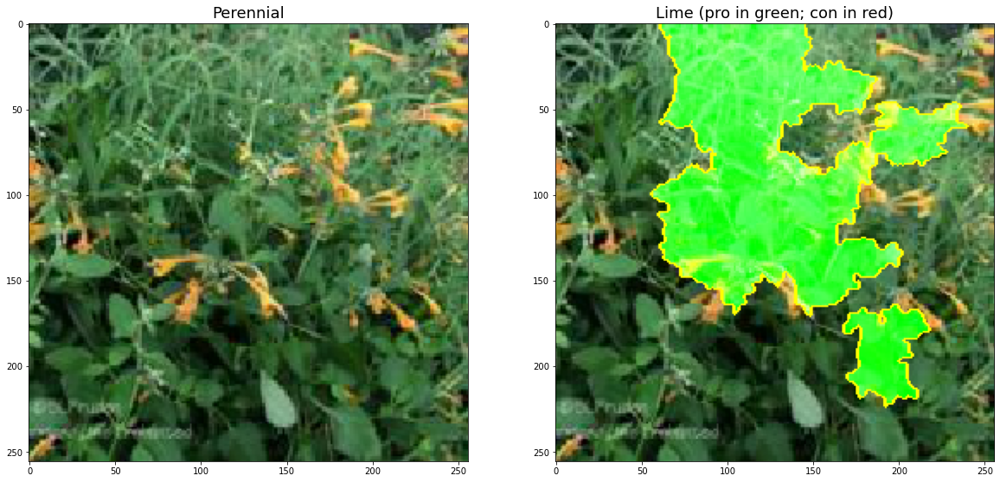

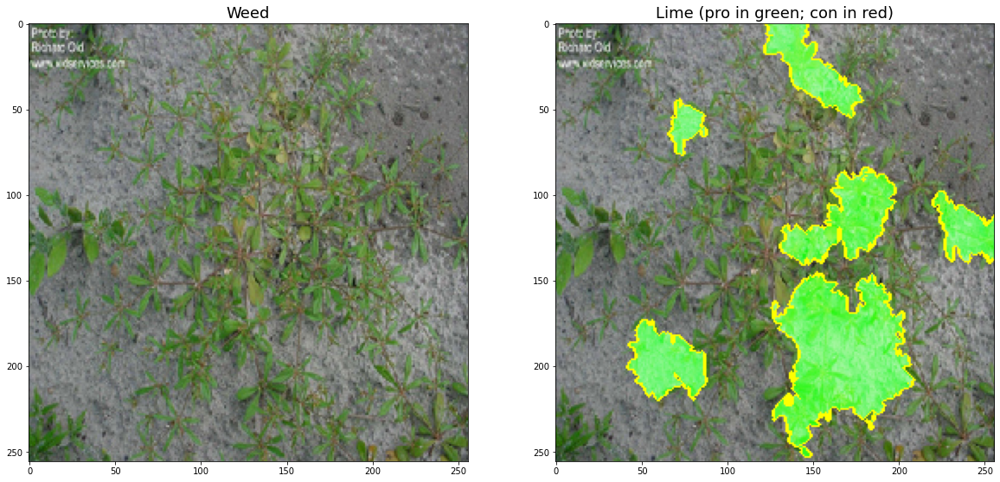

In [90]:
fx.display_lime(model_9, val_generator)

In [91]:
def trial_10(image):
    layers = [
        Input(image.shape),
        Conv2D(64, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(128, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(128, activation = 'relu'),
        Dense(64, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [92]:
model_10 = trial_10(train_generator[0][0][0])
model_10.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 252, 252, 64)      4864      
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 126, 126, 64)      0         
_________________________________________________________________
batch_normalization_23 (Batc (None, 126, 126, 64)      256       
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 122, 122, 128)     204928    
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 61, 61, 128)       0         
_________________________________________________________________
batch_normalization_24 (Batc (None, 61, 61, 128)       512       
_________________________________________________________________
flatten_12 (Flatten)         (None, 476288)          

In [93]:
result_10 = model_10.fit(train_generator, epochs = 50, validation_data=val_generator,
                         class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 350s 5s/step - loss: 18.9532 - accuracy: 0.6273 - precision: 0.6383 - val_loss: 5.2376 - val_accuracy: 0.5125 - val_precision: 0.5145
Epoch 2/50
74/74 [==============================] - 350s 5s/step - loss: 12.8281 - accuracy: 0.6350 - precision: 0.6476 - val_loss: 39.1563 - val_accuracy: 0.5144 - val_precision: 0.5144
Epoch 3/50
74/74 [==============================] - 357s 5s/step - loss: 8.0344 - accuracy: 0.6526 - precision: 0.6647 - val_loss: 6.8205 - val_accuracy: 0.5413 - val_precision: 0.5330
Epoch 4/50
74/74 [==============================] - 354s 5s/step - loss: 6.6546 - accuracy: 0.6441 - precision: 0.6564 - val_loss: 3.3759 - val_accuracy: 0.5355 - val_precision: 0.5291
Epoch 5/50
74/74 [==============================] - 352s 5s/step - loss: 4.4662 - accuracy: 0.6562 - precision: 0.6679 - val_loss: 1.8996 - val_accuracy: 0.6238 - val_precision: 0.5865
Epoch 6/50
74/74 [==============================] - 352s 5s/step - loss:

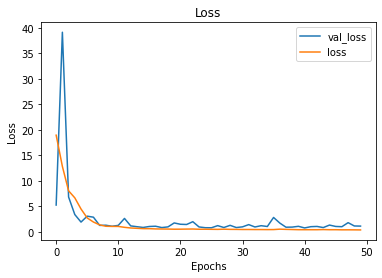

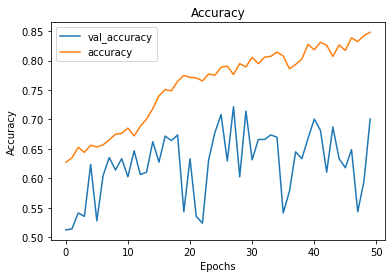

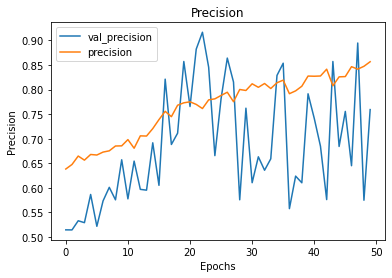

In [94]:
fx.visualize_training_results(result_10)

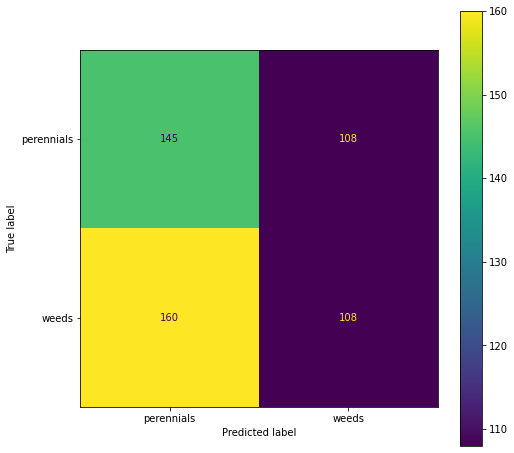

In [95]:
fx.create_confusion_matrix(model_10, val_generator)

In [96]:
fx.get_metrics(model_10, val_generator)

Accuracy: 0.4971209213051823
Precision: 0.5138888888888888


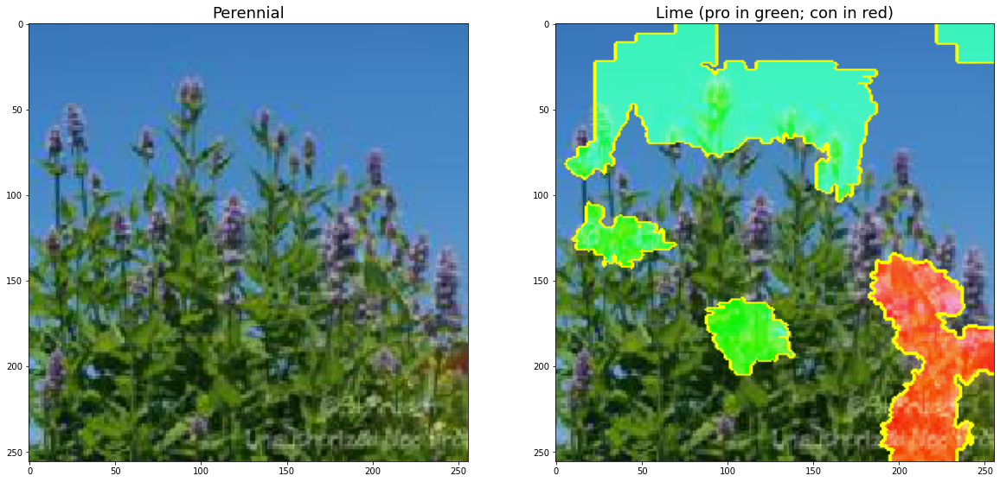

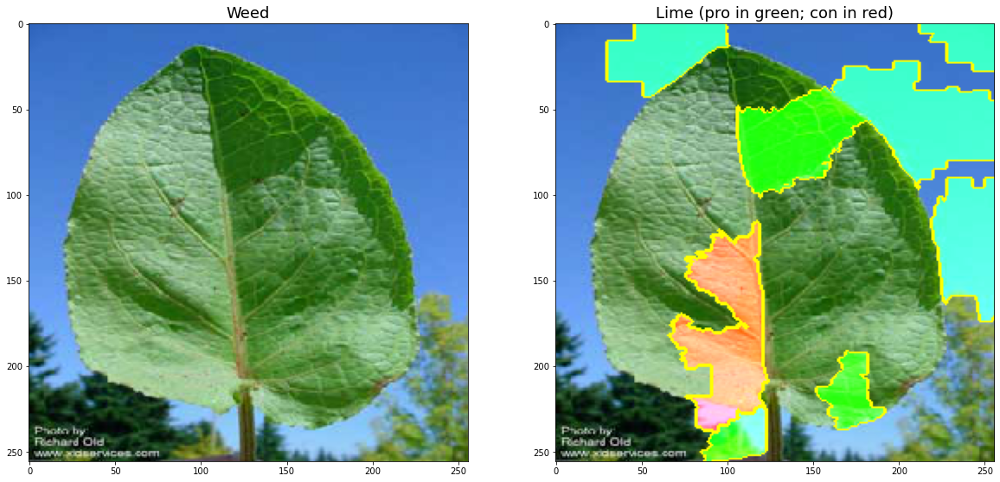

In [97]:
fx.display_lime(model_10, val_generator)

In [98]:
def trial_11(image):
    layers = [
        Input(image.shape),
        Conv2D(64, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(128, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Conv2D(256, (5, 5), activation = 'relu'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),
        Flatten(),
        Dense(128, activation = 'relu'),
        Dense(64, activation = 'relu'),
        Dense(1, activation = 'sigmoid')
    ]
    model = Sequential(layers)
    model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy', 'Precision'])
    return model

In [99]:
model_11 = trial_11(train_generator[0][0][0])
model_11.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_27 (Conv2D)           (None, 252, 252, 64)      4864      
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 126, 126, 64)      0         
_________________________________________________________________
batch_normalization_25 (Batc (None, 126, 126, 64)      256       
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 122, 122, 128)     204928    
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 61, 61, 128)       0         
_________________________________________________________________
batch_normalization_26 (Batc (None, 61, 61, 128)       512       
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 57, 57, 256)     

In [100]:
result_11 = model_11.fit(train_generator, epochs = 50, validation_data=val_generator,
                         class_weight = train_class_weights, callbacks = [early_stop_loss])

Epoch 1/50
74/74 [==============================] - 492s 7s/step - loss: 10.0660 - accuracy: 0.6188 - precision: 0.6339 - val_loss: 10.7274 - val_accuracy: 0.5067 - val_precision: 0.5108
Epoch 2/50
74/74 [==============================] - 487s 7s/step - loss: 9.7392 - accuracy: 0.6083 - precision: 0.6202 - val_loss: 4.3682 - val_accuracy: 0.5374 - val_precision: 0.5542
Epoch 3/50
74/74 [==============================] - 493s 7s/step - loss: 5.5505 - accuracy: 0.6175 - precision: 0.6300 - val_loss: 5.5316 - val_accuracy: 0.5182 - val_precision: 0.5168
Epoch 4/50
74/74 [==============================] - 502s 7s/step - loss: 3.7042 - accuracy: 0.6637 - precision: 0.6750 - val_loss: 4.6462 - val_accuracy: 0.5221 - val_precision: 0.5187
Epoch 5/50
74/74 [==============================] - 500s 7s/step - loss: 3.1287 - accuracy: 0.6569 - precision: 0.6671 - val_loss: 1.4838 - val_accuracy: 0.5624 - val_precision: 0.5439
Epoch 6/50
74/74 [==============================] - 494s 7s/step - loss: 

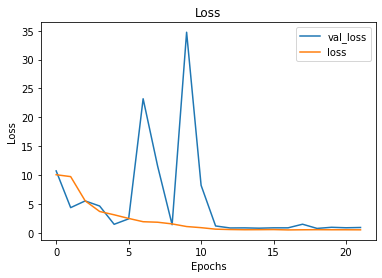

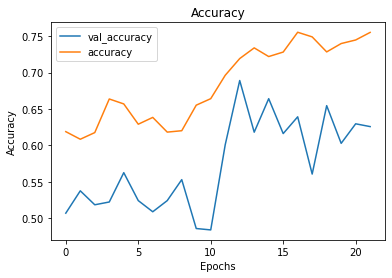

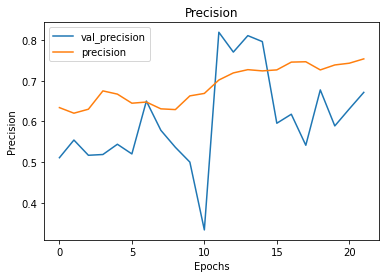

In [101]:
fx.visualize_training_results(result_11)

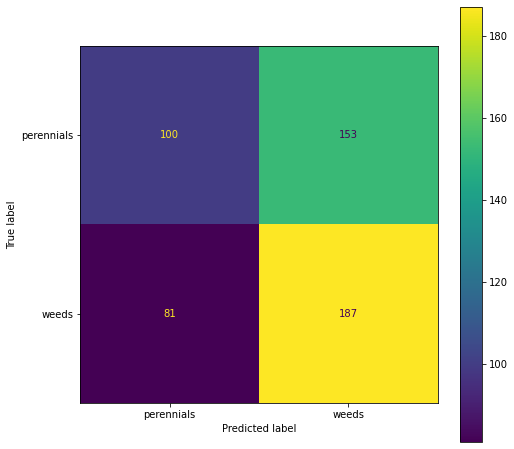

In [102]:
fx.create_confusion_matrix(model_11, val_generator)

In [103]:
fx.get_metrics(model_11, val_generator)

Accuracy: 0.527831094049904
Precision: 0.5323529411764706


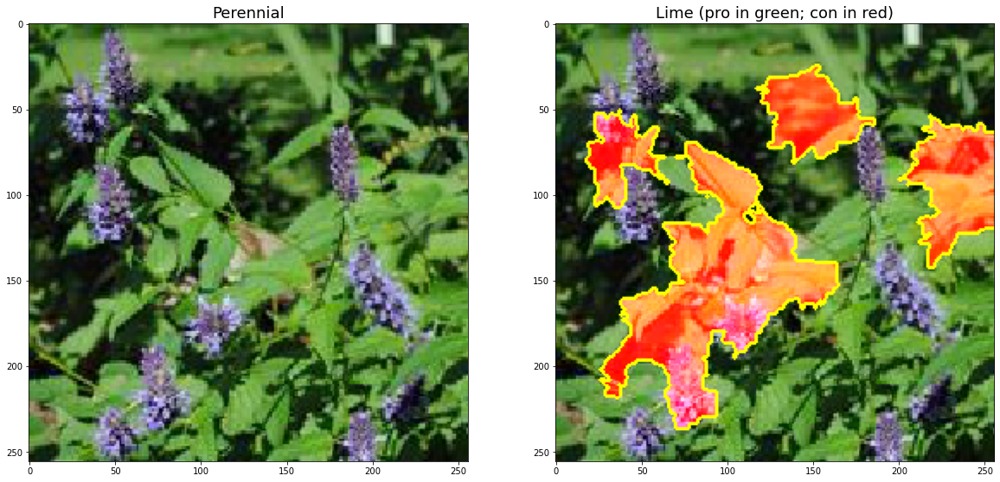

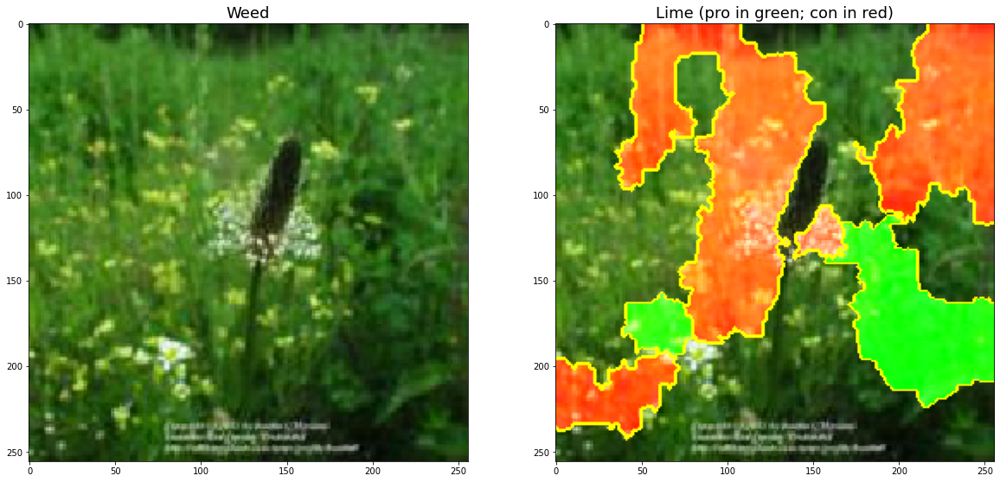

In [104]:
fx.display_lime(model_11, val_generator)